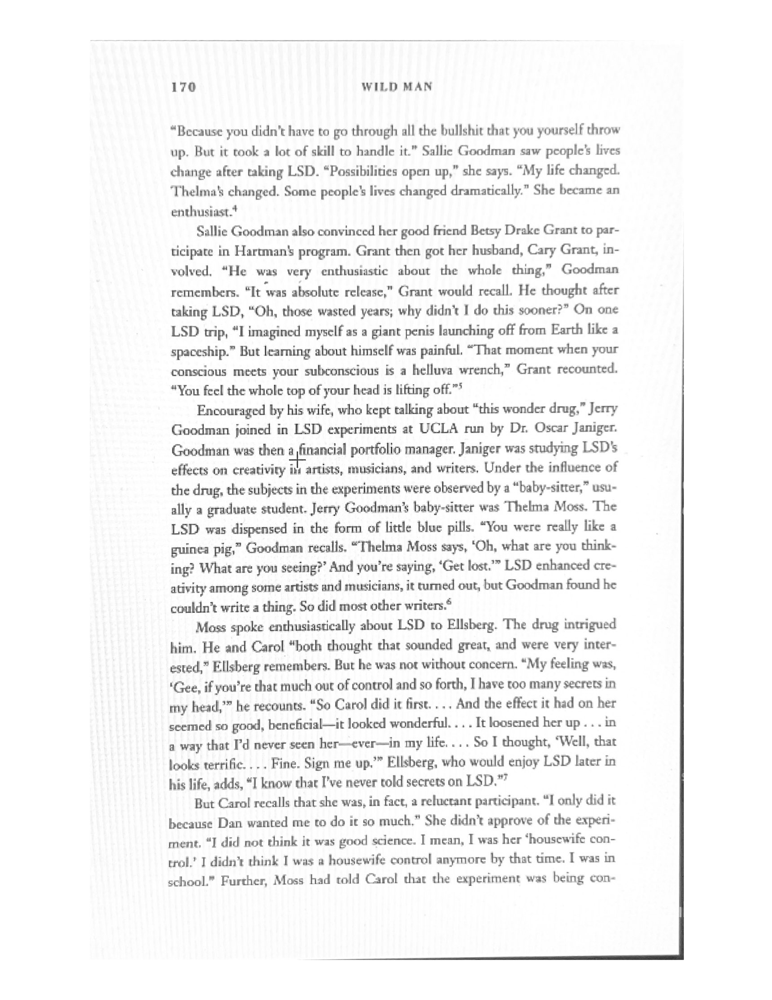

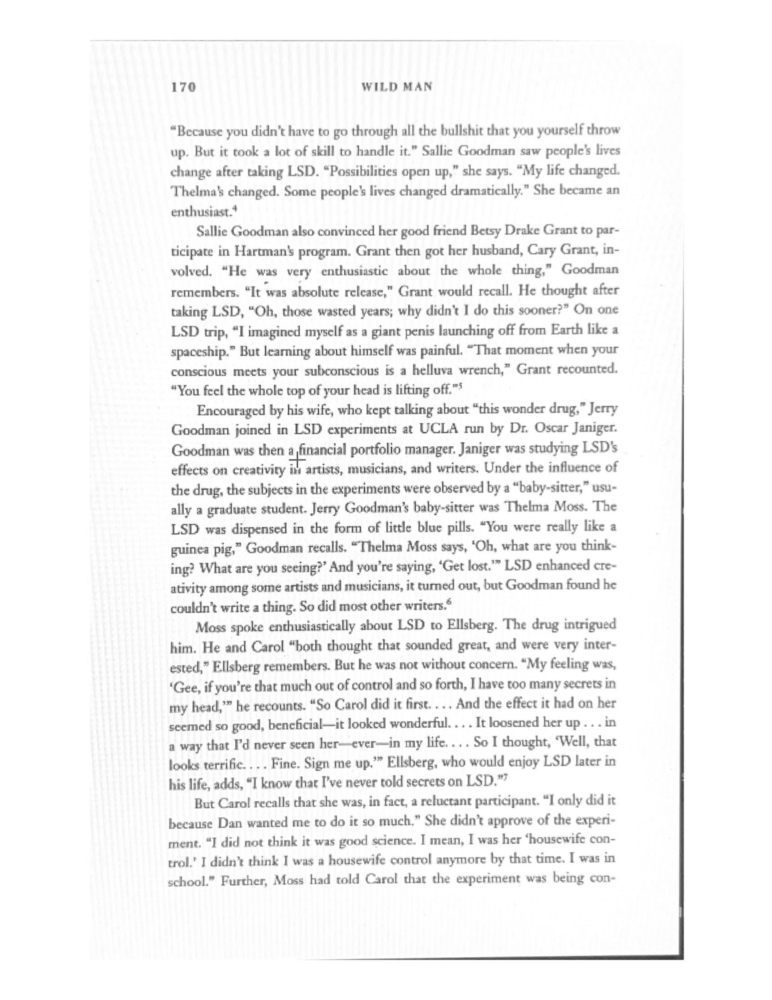

In [6]:
import cv2
import numpy as np
from pdf2image import convert_from_path
from PIL import Image as PILImage
from IPython.display import Image, display

def display_image_opencv(img, convert_bgr_to_rgb=True):
    """Convert an OpenCV image to RGB and display it in Jupyter."""
    if convert_bgr_to_rgb:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_pil = PILImage.fromarray(img)
    display(img_pil)

def convert_pdf_to_images(pdf_path):
    return convert_from_path(pdf_path)

def find_content_boundaries(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2GRAY)
    display_image_opencv(gray, convert_bgr_to_rgb=False)
    
    # Apply GaussianBlur
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    display_image_opencv(blurred, convert_bgr_to_rgb=False)


    
    # Detect edges using Canny
    edges = cv2.Canny(blurred, 50, 150)
    
    # Find contours
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # If no contours are detected, return the original dimensions
    if not contours:
        return 0, 0, image.width, image.height
    
    # Find bounding box coordinates
    x, y, w, h = cv2.boundingRect(np.concatenate(contours))
    return x, y, x+w, y+h

def crop_image_to_content(image):
    x1, y1, x2, y2 = find_content_boundaries(image)
    return image.crop((x1, y1, x2, y2))

def main():
    pdf_path = '/Users/jamescourson/Documents/scripts/image-to-text/WILD MAN.pdf'
    output_pdf_path = 'cropped_pdf.pdf'
    
    images = convert_pdf_to_images(pdf_path)
    cropped_images = [crop_image_to_content(img) for img in images]

    cropped_images[0].save(output_pdf_path, save_all=True, append_images=cropped_images[1:])

if __name__ == "__main__":
    main()


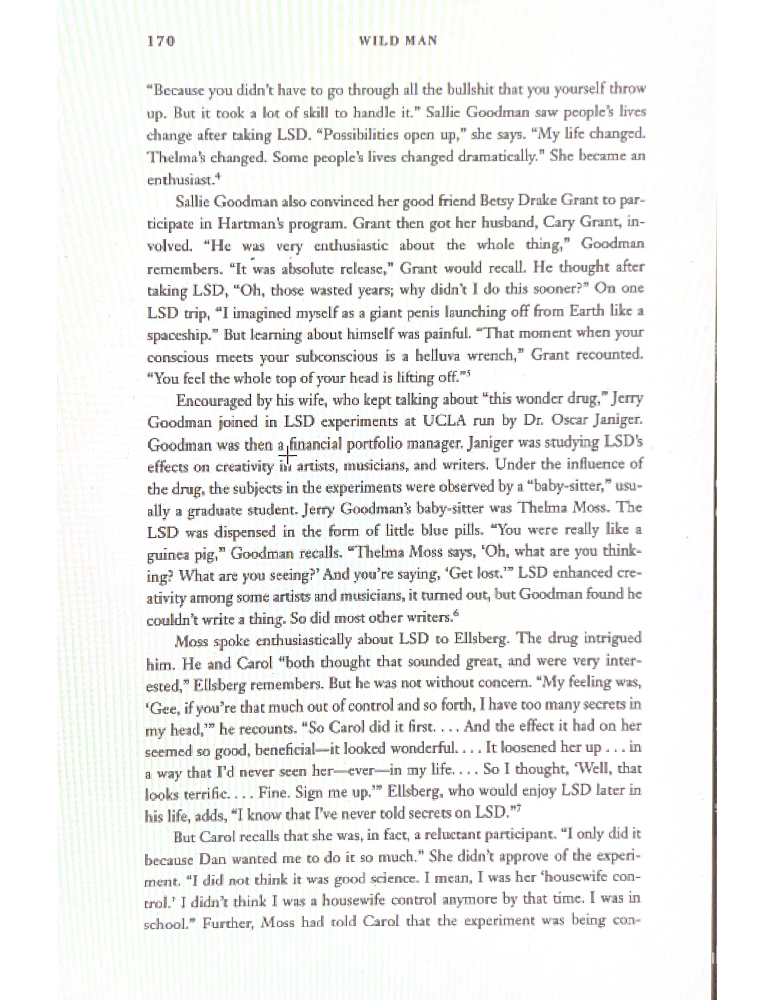

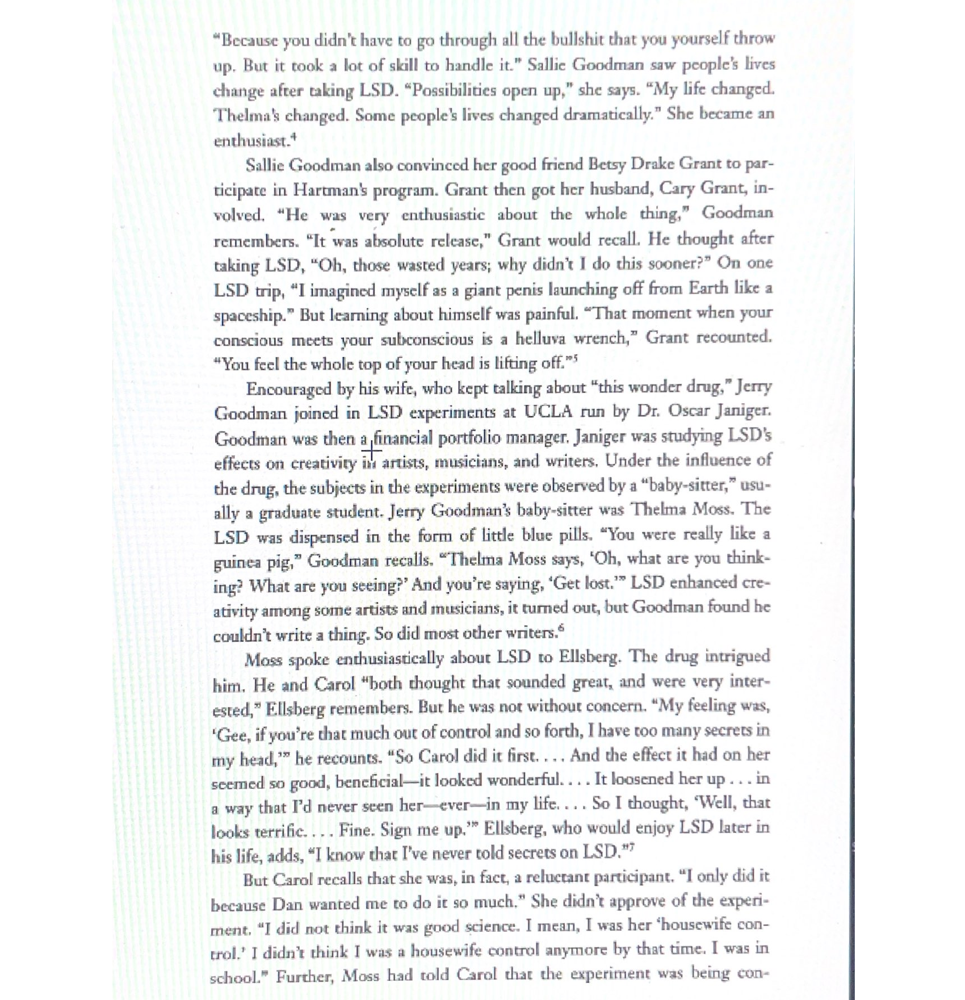

In [34]:
import cv2
import numpy as np


def crop_percentage(image, percent=5):
    """
    Crop the given percentage from the edges of an image.

    Params:
    - image: pre-loaded image array
    - percent: percentage of the edge to crop

    Returns:
    - cropped image array
    """
    h, w = image.shape[:2]
    h_crop = int(h * percent / 100)
    w_crop = int(w * percent / 100)

    return image[h_crop:-h_crop, w_crop:-w_crop]

def find_crop_boundaries(image, depth_percent_top=3, depth_percent_bottom=2, threshold_top=.15, threshold_bottom=0.2):
    """
    Find crop boundaries based on pixel density.

    Params:
    - image: pre-loaded image array
    - depth_percent: percentage of the image height to use as depth for calculating pixel density
    - threshold: density threshold to determine cropping boundary

    Returns:
    - y_start, y_end: vertical cropping boundaries
    """

    # Convert to grayscale if it's not
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Threshold the image to binary using Otsu's method
    _, bin_img = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    h, w = bin_img.shape

    # Calculate depth in pixels from the percentage
    depth_top = int(h * depth_percent_top / 100)
    depth_bottom = int(h * depth_percent_bottom / 100)

    # Scanning from the top
    y_start = 0
    for y in range(0, h - depth_top):
        density = np.sum(bin_img[y:y+depth_top, :]) / (255.0 * w * depth_top)
        if density > threshold_top:
            y_start = y
            break

    # Scanning from the bottom
    y_end = h - 1
    for y in range(h - 1, depth_bottom, -1):
        density = np.sum(bin_img[y-depth_bottom:y, :]) / (255.0 * w * depth_bottom)
        if density > threshold_bottom:
            y_end = y
            break

    return y_start, y_end


def convert_pdf_to_images(pdf_path):
    return convert_from_path(pdf_path)

def display_image_opencv(img, convert_bgr_to_rgb=True):
    """Convert an OpenCV image to RGB and display it in Jupyter."""
    if convert_bgr_to_rgb:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_pil = PILImage.fromarray(img)
    display(img_pil)


# Use the function
pdf_path = '/Users/jamescourson/Documents/scripts/image-to-text/WILD MAN.pdf'
output_pdf_path = 'cropped_pdf.pdf'

images = convert_pdf_to_images(pdf_path)

opencv_image = np.array(images[0])

# Convert RGB to BGR if you are going to work with OpenCV functions later
opencv_image = opencv_image[:, :, ::-1]

opencv_image = crop_percentage(opencv_image, 5)

display_image_opencv(opencv_image, convert_bgr_to_rgb=False)

y_start, y_end = find_crop_boundaries(opencv_image)

# Crop and save the image
opencv_image = np.array(images[0])
cropped_image = opencv_image[y_start:y_end, :]
display_image_opencv(cropped_image, convert_bgr_to_rgb=False)
# cv2.imwrite('cropped_image.jpg', cropped_image)
